In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
from criar_climograma import *

# carregando o dados salvos
climate_data = load_climate_data()



End


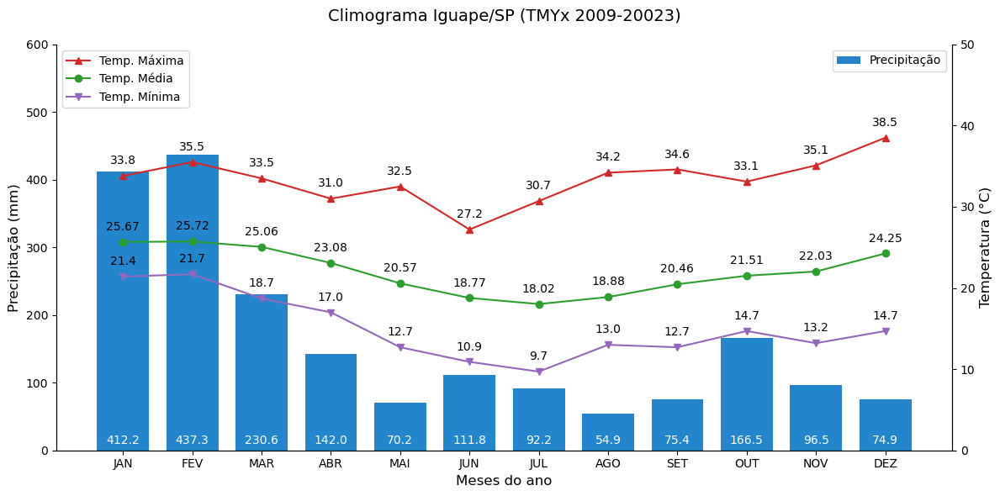

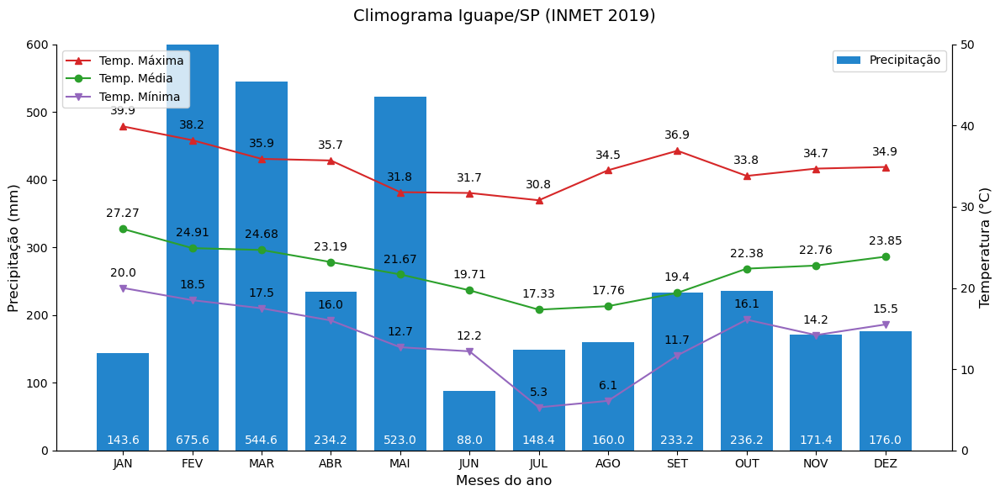

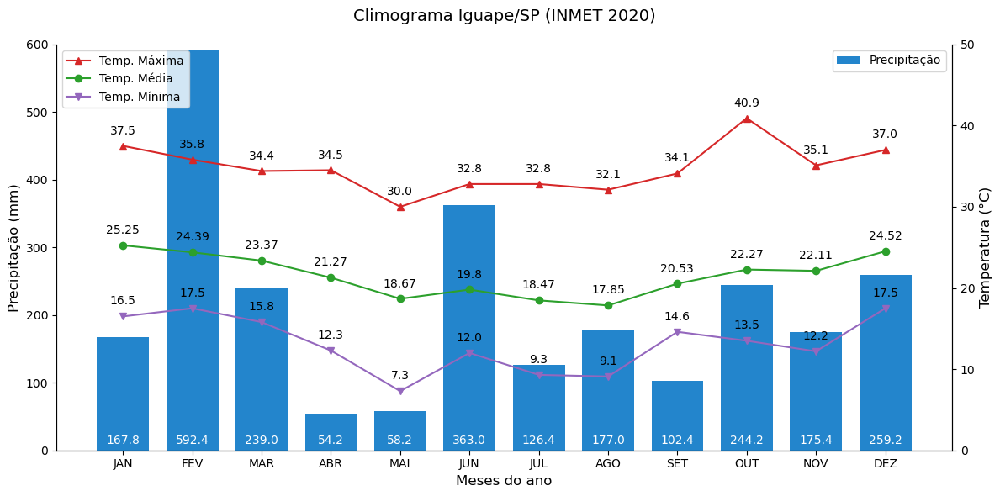

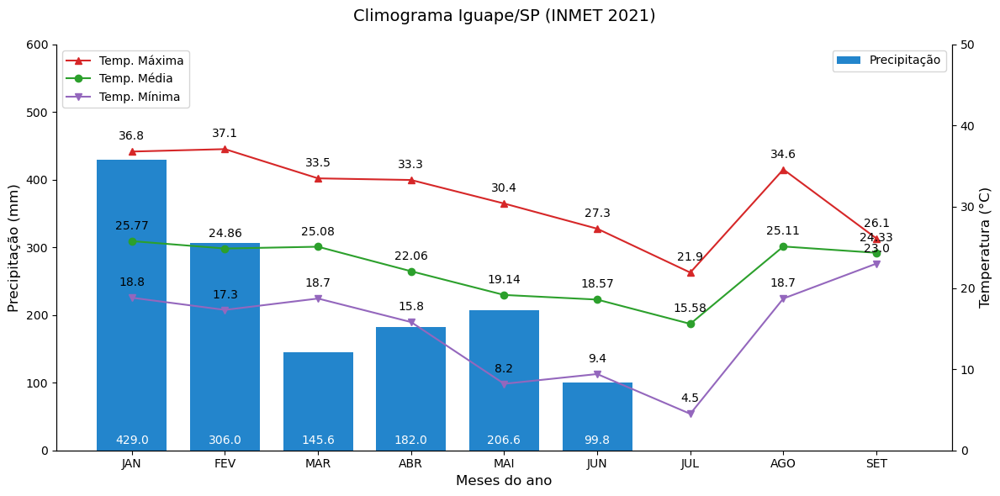

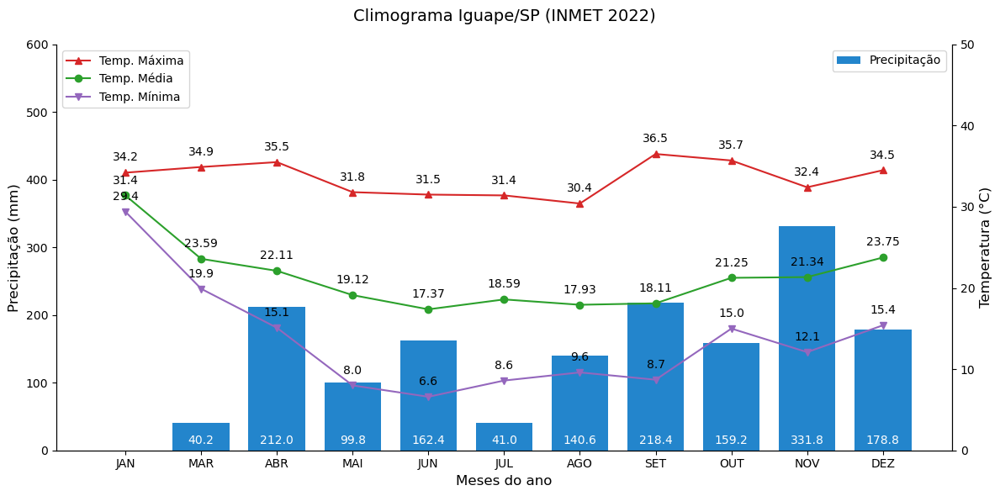

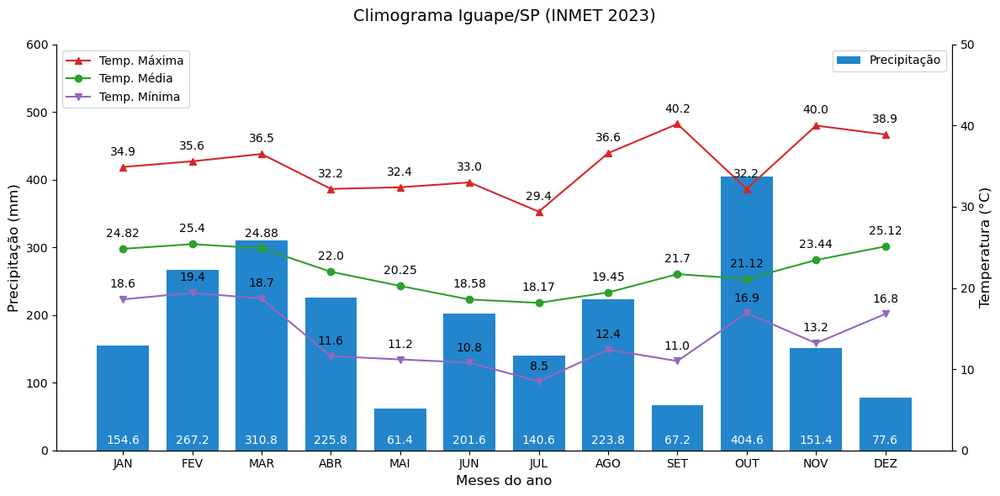

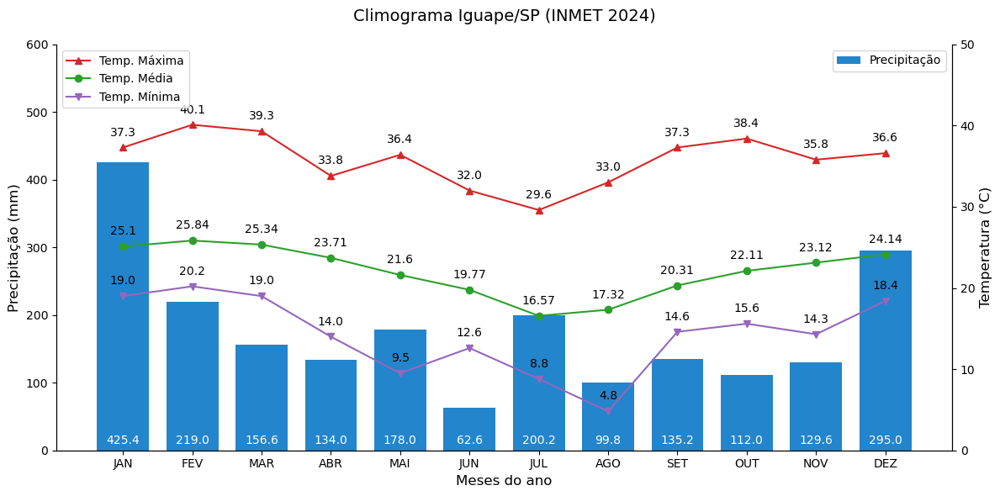

In [ ]:
# criar os climogramas
for key in climate_data.keys():
    gerar_climograma(climate_data[key])

print('\n\nEnd')

In [2]:
climate_data['iguape_epw_mensal'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Datetime           12 non-null     datetime64[ns]
 1   Temp_max           12 non-null     float64       
 2   Temp_min           12 non-null     float64       
 3   Temp_med           12 non-null     float64       
 4   Temp_dp            12 non-null     float64       
 5   Temp_mediana       12 non-null     float64       
 6   Umi_max            12 non-null     int64         
 7   Umi_min            12 non-null     int64         
 8   Umi_med            12 non-null     float64       
 9   Umi_dp             12 non-null     float64       
 10  Umi_mediana        12 non-null     float64       
 11  Vel_vento_max      12 non-null     float64       
 12  Vel_vento_min      12 non-null     float64       
 13  Vel_vento_med      12 non-null     float64       
 14  Vel_vento_dp

In [3]:
for key in climate_data.keys():
    df = climate_data[key]
    print(key)
    break

iguape_epw_mensal


In [4]:
type(df)

pandas.core.frame.DataFrame

In [5]:
df.info()
# df.Chuva_tot.max()//100+1*100

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Datetime           12 non-null     datetime64[ns]
 1   Temp_max           12 non-null     float64       
 2   Temp_min           12 non-null     float64       
 3   Temp_med           12 non-null     float64       
 4   Temp_dp            12 non-null     float64       
 5   Temp_mediana       12 non-null     float64       
 6   Umi_max            12 non-null     int64         
 7   Umi_min            12 non-null     int64         
 8   Umi_med            12 non-null     float64       
 9   Umi_dp             12 non-null     float64       
 10  Umi_mediana        12 non-null     float64       
 11  Vel_vento_max      12 non-null     float64       
 12  Vel_vento_min      12 non-null     float64       
 13  Vel_vento_med      12 non-null     float64       
 14  Vel_vento_dp

# Como fazer um CLIMOGRAMA no PYTHON

baseado no [vídeo de mesmo nome](https://youtu.be/4kQ_fiEWxKc?si=W1BtylsXZoK7AsMe) usando a biblioteca **Plotly**

In [6]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [7]:
fig = make_subplots(specs=[[{'secondary_y':True}]])

# pluviosidade
fig.add_trace(
    go.Bar(
        x=df['Mês'],
        y=df['Chuva_tot'],
        name='Pluviosidade (mm)',
        marker_color='cornflowerblue'
    ),
    secondary_y= False
)

# temperatura média
fig.add_trace(
    go.Scatter(
        x=df['Mês'],
        y=df['Temp_med'],
        name='Temperatura média (°C)',
        mode='lines',
        line={'color':'limegreen', 'width':4}
    ),
    secondary_y=True
)

# temperatura máxima
fig.add_trace(
    go.Scatter(
        x=df['Mês'],
        y=df['Temp_max'],
        name='Temperatura máxima (°C)',
        mode='lines',
        line={'color':'maroon', 'width':4}
    ),
    secondary_y=True
)

# temperatura mínima
fig.add_trace(
    go.Scatter(
        x=df['Mês'],
        y=df['Temp_min'],
        name='Temperatura mínima (°C)',
        mode='lines',
        line={'color':'goldenrod', 'width':4}
    ),
    secondary_y=True
)

fig.update_xaxes(title_text='Mês')
fig.update_yaxes(title_text='Pluviosidade (mm)', secondary_y=False)
fig.update_yaxes(title_text='Temperatura média (°C)', secondary_y=True)

fig.update_layout(
    plot_bgcolor='white',
    yaxis1={'range':[0,550]},
    yaxis2={'range':[0,45]}
)

fig.show()

# Gráfico de Climatologia em Python | Eng. Ana Marcon

baseado no [vídeo de mesmo nome.](https://youtu.be/EXszblCXSZU?si=bTi5dmN6SDy0-25m)

In [8]:
import matplotlib.pyplot as plt

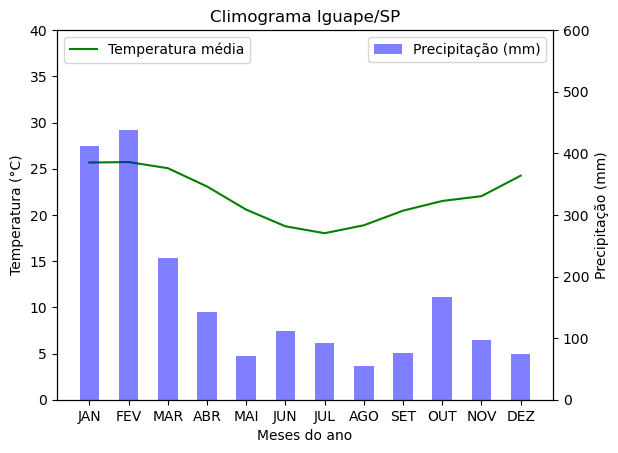

In [9]:
# criar a figura
fig, ax1 = plt.subplots()
ax1.set_xlabel('Meses do ano') # nome do eixo

# criar o eixo Y à esquerda
ax1.plot(df['Mês'], df['Temp_med'], color='green')
ax1.set_ylabel('Temperatura (°C)') # define o nome do eixo
ax1.set_ylim(0,40)
ax1.legend(['Temperatura média'], loc='upper left')

# definir o 2º eixo Y
ax2 = ax1.twinx()

# criar o eixo Y à direita
ax2.bar(df['Mês'], df['Chuva_tot'], width=0.5, alpha=0.5, color='blue')
ax2.grid(False)
ax2.set_ylabel('Precipitação (mm)')
# ax2.set_ylim(0,100*(df['Chuva_tot']//100+1))
ax2.set_ylim(0,600)
ax2.legend(['Precipitação (mm)'], loc='upper right')

# título do gráfico
plt.title('Climograma Iguape/SP')
plt.show()

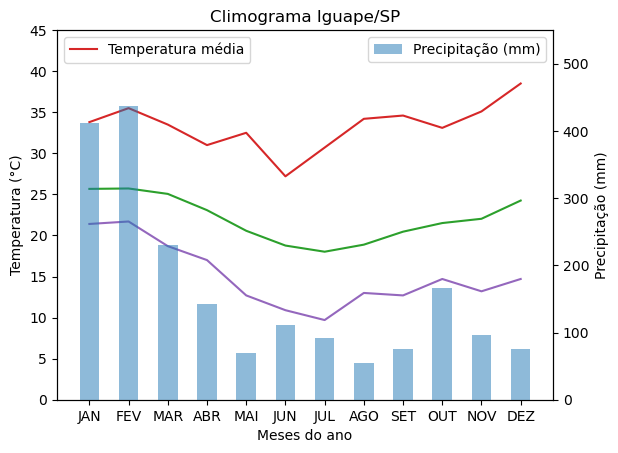

In [10]:
# criar a figura
fig, ax1 = plt.subplots()
ax1.set_xlabel('Meses do ano') # nome do eixo

# criar o eixo Y à esquerda
ax1.plot(df['Mês'], df['Temp_max'], color='#d62728')
ax1.plot(df['Mês'], df['Temp_med'], color='#2ca02c')
ax1.plot(df['Mês'], df['Temp_min'], color='#9467bd')

ax1.set_ylabel('Temperatura (°C)') # define o nome do eixo
ax1.set_ylim(0,45)
ax1.legend(['Temperatura média'], loc='upper left')

# definir o 2º eixo Y
ax2 = ax1.twinx()

# criar o eixo Y à direita
ax2.bar(df['Mês'], df['Chuva_tot'], width=0.5, alpha=0.5, color='#1f77b4')
ax2.grid(False)
ax2.set_ylabel('Precipitação (mm)')
# ax2.set_ylim(0,100*(df['Chuva_tot']//100+1))
ax2.set_ylim(0,550)
ax2.legend(['Precipitação (mm)'], loc='upper right')

# título do gráfico
plt.title('Climograma Iguape/SP')
plt.show()

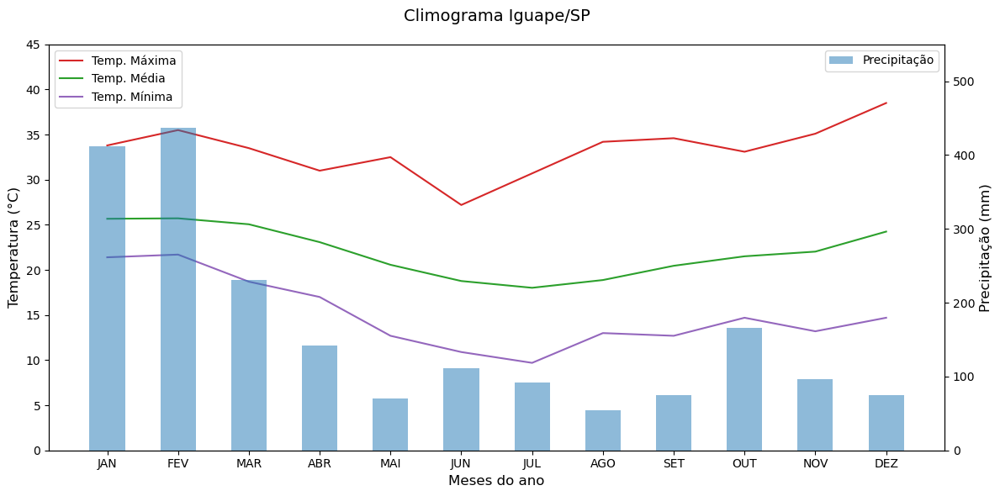

In [11]:
import matplotlib.pyplot as plt

# Criar figura e configurar eixos
fig, ax1 = plt.subplots(figsize=(12, 6))
ax1.set_xlabel('Meses do ano', fontsize=12)

# Remover linhas verticais do grid
ax1.xaxis.grid(False)  # <--- Linha crítica para remover grids verticais

# Plotar temperaturas (eixo esquerdo)
ax1.plot(
    df['Mês'], df['Temp_max'],
    color='#d62728', label='Temp. Máxima'
)
ax1.plot(
    df['Mês'], df['Temp_med'],
    color='#2ca02c', label='Temp. Média'
)
ax1.plot(
    df['Mês'], df['Temp_min'],
    color='#9467bd', label='Temp. Mínima'
)

ax1.set_ylabel('Temperatura (°C)', fontsize=12, color='#000000')
ax1.tick_params(axis='y', labelcolor='#000000')
ax1.set_ylim(0, 45)
ax1.legend(loc='upper left', frameon=True)

# Criar eixo de precipitação (eixo direito)
ax2 = ax1.twinx()
ax2.bar(
    df['Mês'], df['Chuva_tot'],
    width=0.5, alpha=0.5, color='#1f77b4', label='Precipitação'
)

ax2.yaxis.grid(False)  # <--- Linha crítica para remover grids verticais
ax2.set_ylabel('Precipitação (mm)', fontsize=12, color='#000000')
ax2.tick_params(axis='y', labelcolor='#000000')
ax2.set_ylim(0, 550)
ax2.legend(loc='upper right', frameon=True)

# Ajustes finais
plt.title('Climograma Iguape/SP', fontsize=14, pad=20)
plt.tight_layout()
# plt.savefig('../img/climograma_iguape_epw.png')
plt.show()


## Criando os valores das barras

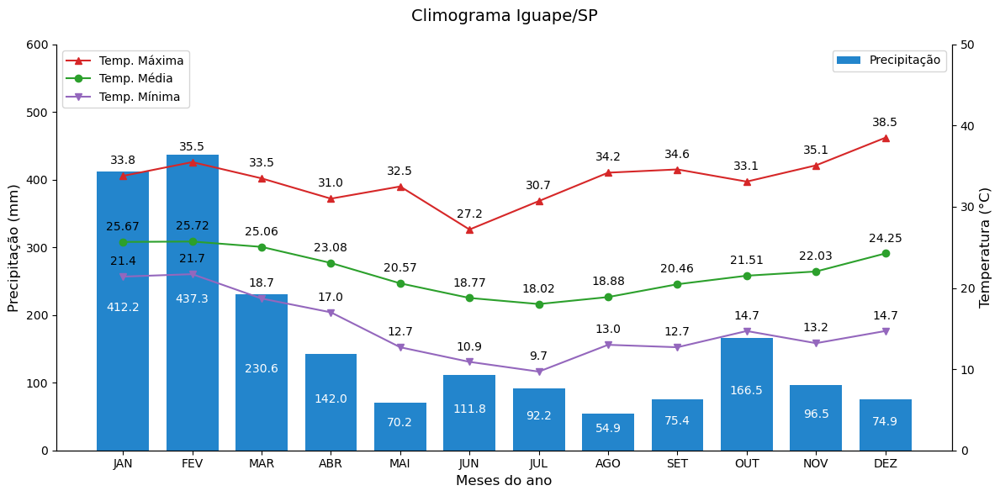

In [12]:
import matplotlib.pyplot as plt

# Criar figura e configurar eixos
fig, ax1 = plt.subplots(figsize=(12, 6))
ax1.set_xlabel('Meses do ano', fontsize=12)

# Remover linhas verticais do grid
ax1.xaxis.grid(False)  

# Criar eixo de precipitação (eixo direito)
ax1.bar(
    df['Mês'], df['Chuva_tot'],
    width=0.75, alpha=1.0, color='#2385CC', label='Precipitação'
)

ax1.yaxis.grid(False)  # <--- Linha crítica para remover grids verticais
ax1.set_ylabel('Precipitação (mm)', fontsize=12, color='#000000')
ax1.tick_params(axis='y', labelcolor='#000000')
ax1.set_ylim(0, 600)
ax1.legend(loc='upper right', frameon=True)

# Plotar temperaturas (eixo esquerdo)
ax2 = ax1.twinx()
ax2.plot(
    df['Mês'], df['Temp_max'],
    color='#d62728', label='Temp. Máxima', marker='^'
)
ax2.plot(
    df['Mês'], df['Temp_med'],
    color='#2ca02c', label='Temp. Média', marker='o'
)
ax2.plot(
    df['Mês'], df['Temp_min'],
    color='#9467bd', label='Temp. Mínima', marker='v'
)

ax2.set_ylabel('Temperatura (°C)', fontsize=12, color='#000000')
ax2.tick_params(axis='y', labelcolor='#000000')
ax2.set_ylim(0, 50)
ax2.legend(loc='upper left', frameon=True)

# colocar valores dos pontos
colunas = ['Temp_max', 'Temp_med', 'Temp_min']

for mes in range(df.shape[0]):
    ax1.annotate(
        text=str(df.at[mes,'Chuva_tot']),
        color='white',
        horizontalalignment='center',
        xy=(mes,df.at[mes,'Chuva_tot']/2),
        # xytext=(mes-0.25,df.at[mes,'Chuva_tot']/2)
    )
    
    for coluna in colunas:
        ax2.annotate(
            text=str(df.at[mes,coluna]),
            horizontalalignment='center',
            xy=(mes, df.at[mes,coluna]),
            xycoords='data',
            xytext=(0,10),
            textcoords='offset points'
        )

# Ajustes finais
ax1.spines['top'].set_visible(False) # tirar linha quadro superior do grafico 1
ax2.spines['top'].set_visible(False) # tirar linha quadro superior do grafico 2

plt.title('Climograma Iguape/SP', fontsize=14, pad=20)
plt.tight_layout()

# plt.savefig('../img/climograma_iguape_epw.png')
plt.show()


In [13]:
for mes in range(df.shape[0]):
   print(mes,df.at[mes,'Temp_min'])

0 21.4
1 21.7
2 18.7
3 17.0
4 12.7
5 10.9
6 9.7
7 13.0
8 12.7
9 14.7
10 13.2
11 14.7


# Colocando os labels no gráfico

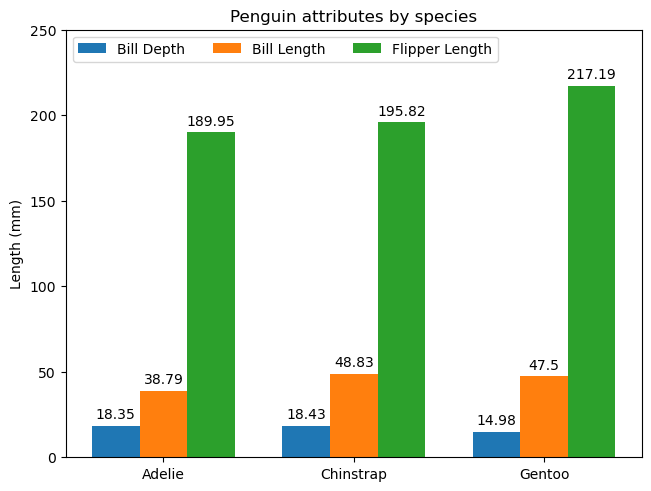

In [14]:
# data from https://allisonhorst.github.io/palmerpenguins/

import matplotlib.pyplot as plt
import numpy as np

species = ("Adelie", "Chinstrap", "Gentoo")
penguin_means = {
    'Bill Depth': (18.35, 18.43, 14.98),
    'Bill Length': (38.79, 48.83, 47.50),
    'Flipper Length': (189.95, 195.82, 217.19),
}

x = np.arange(len(species))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Length (mm)')
ax.set_title('Penguin attributes by species')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 250)

plt.show()

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [16]:
# Sample data (replace with your actual data)
data = {
    'Month': ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
    'Temperature_C': [10, 12, 15, 18, 22, 25, 27, 26, 23, 19, 14, 11],
    'Precipitation_mm': [50, 40, 35, 20, 10, 5, 10, 20, 30, 40, 50, 60]
}
df = pd.DataFrame(data)

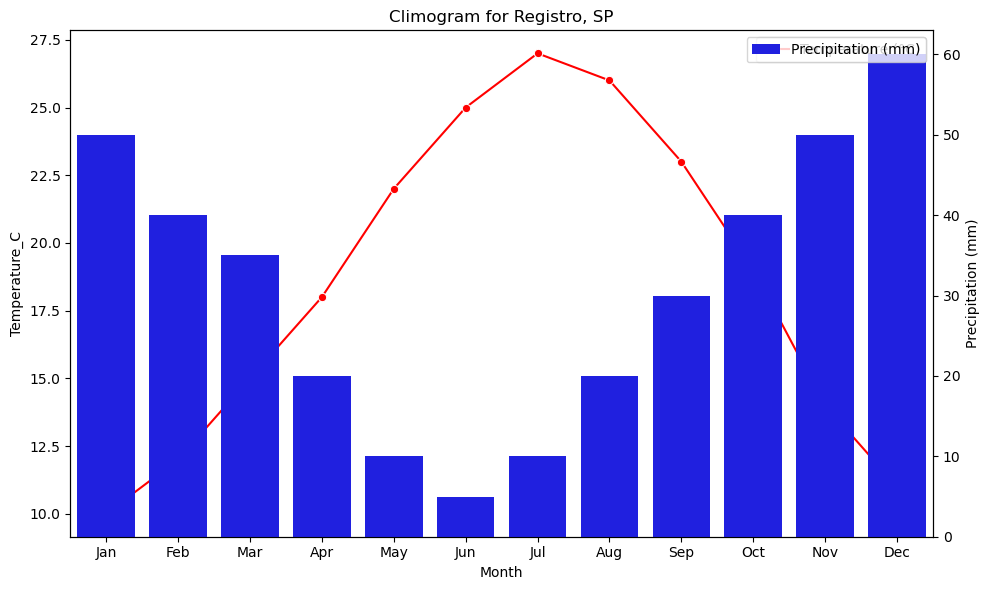

In [17]:
plt.figure(figsize=(10, 6)) # Adjust figure size as needed

# Temperature (left Y-axis)
sns.lineplot(x='Month', y='Temperature_C', data=df, marker='o', color='red', label='Temperature (°C)')

# Precipitation (right Y-axis)
ax2 = plt.gca().twinx()  # Create a twin axis
sns.barplot(x='Month', y='Precipitation_mm', data=df, ax=ax2, color='blue', label='Precipitation (mm)')

# Customize labels and title
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
ax2.set_ylabel('Precipitation (mm)')
plt.title('Climogram for Registro, SP')
plt.legend(loc='upper left')
ax2.legend(loc='upper right')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show()

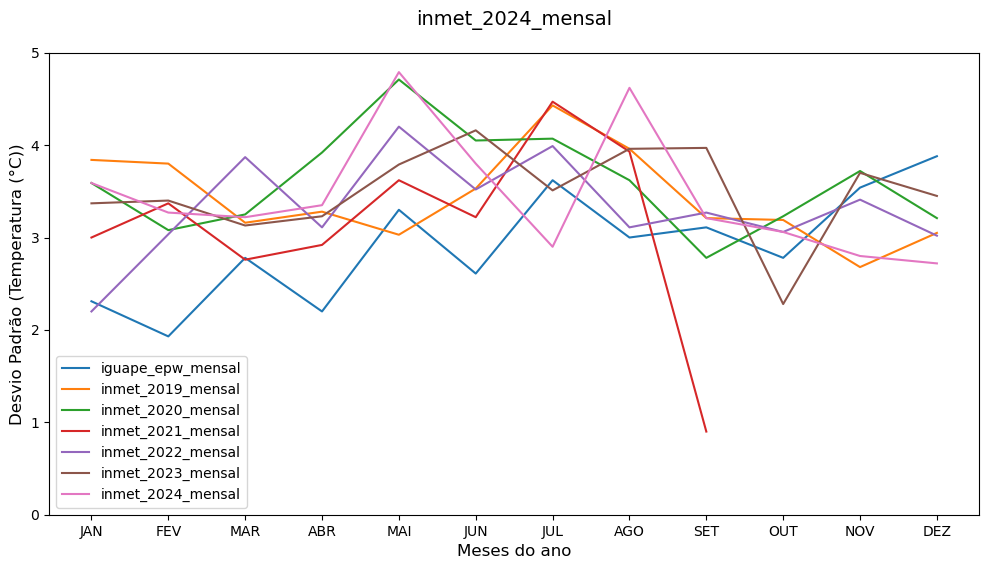

In [8]:
fig, ax = plt.subplots(figsize=(12, 6))

for key in climate_data.keys():
    df = climate_data[key]
    ax.plot(
        df['Mês'],
        df['Temp_dp'],
        label=key
    )
    

ax.set_xlabel('Meses do ano', fontsize=12, color='#000000')
ax.set_ylabel('Desvio Padrão (Temperatura (°C))', fontsize=12, color='#000000')
ax.set_ylim(0, 5)
ax.legend(loc='lower left')

plt.title(f'{key}', fontsize=14, pad=20)

plt.show()
    
    # break

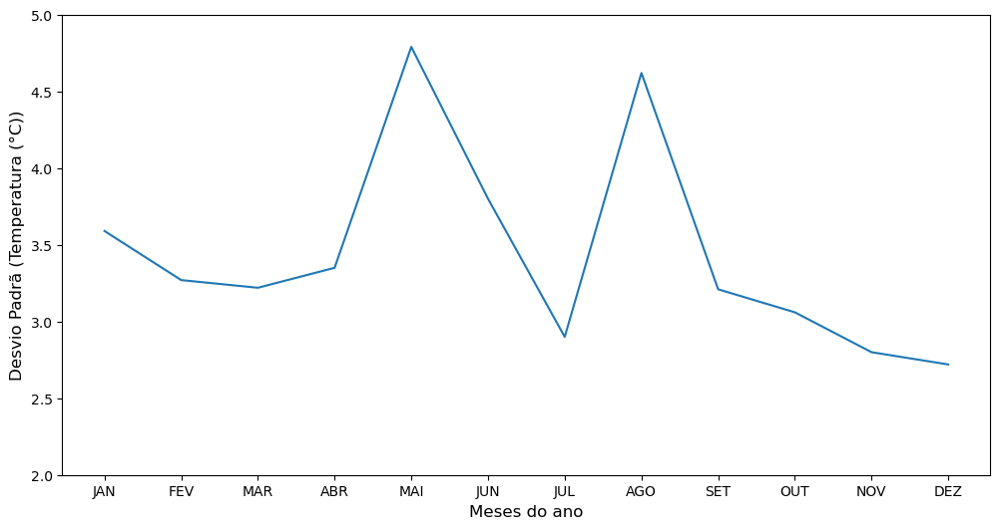

In [34]:
df = climate_data['inmet_2024_mensal']

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(
    df['Mês'],
    df['Temp_dp']
)

ax.set_xlabel('Meses do ano', fontsize=12, color='#000000')
ax.set_ylabel('Desvio Padrã (Temperatura (°C))', fontsize=12, color='#000000')
ax.set_ylim(2, 5)

plt.show()